In [1]:
import warnings
warnings.filterwarnings('ignore') 

import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import DBSCAN, KMeans, AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from PIL import Image
import os
from tqdm import tqdm
import pandas as pd
import cv2
from scipy.spatial.distance import pdist,squareform
from scipy.cluster.hierarchy import linkage,fcluster
from skimage import io,segmentation ,color
from skimage import segmentation

# Extract 24 random images from unsplash 

In [2]:
import requests
import os
from io import BytesIO

# Constants
ACCESS_KEY = 'LZ_LwjjgTPyuDnNpyLbIJiIjeS1esf441PF38Dru_9A'
SEARCH_URL = "https://api.unsplash.com/search/photos"
CATEGORIES = {
    'animals': 'cats, dogs, birds, wildlife',  # keywords for animals
    'nature': 'mountains, rivers, forests, nature landscapes',  # keywords for nature
    'shapes': 'geometric shapes, circles, triangles, squares',  # keywords for geometric shapes
    'random': 'abstract, random patterns, textures'  # keywords for random images
}
IMAGES_PER_CATEGORY = 6
IMAGE_SIZE = (500, 500)

# Create a directory for downloads if it doesn't exist
if not os.path.exists('downloads'):
    os.makedirs('downloads')

def download_and_resize_images():
    images = []
    image_count = 1
    for category, search_query in CATEGORIES.items():
        # Parameters for searching images in the category
        params = {
            'client_id': ACCESS_KEY,
            'query': search_query,
            'per_page': IMAGES_PER_CATEGORY
        }

        try:
            # Search for images
            response = requests.get(SEARCH_URL, params=params)
            data = response.json()

            if not isinstance(data.get('results'), list):  # Error handling for bad API response
                raise Exception(data.get('errors', 'Unknown error'))

            for i, item in enumerate(data['results']):
                image_url = item['urls']['regular']  # Using 'regular' size for download
                image_response = requests.get(image_url)

                if image_response.status_code == 200:
                    img = Image.open(BytesIO(image_response.content))
                    img_resized = img.resize(IMAGE_SIZE, Image.Resampling.LANCZOS)

                    # Save the resized image with category in the filename
                    img_resized.save(os.path.join('downloads', f'image_{image_count}.jpg'))
                    images.append(img_resized)
                    print(f'Downloaded and resized image_{image_count}.jpg')
                    image_count += 1
                else:
                    print(f"Failed to download image {i + 1} in category {category}")

        except Exception as e:
            print(f"An error occurred in category {category}: {e}")

    return images

# Run the function to download images
images = download_and_resize_images()

Downloaded and resized image_1.jpg
Downloaded and resized image_2.jpg
Downloaded and resized image_3.jpg
Downloaded and resized image_4.jpg
Downloaded and resized image_5.jpg
Downloaded and resized image_6.jpg
Downloaded and resized image_7.jpg
Downloaded and resized image_8.jpg
Downloaded and resized image_9.jpg
Downloaded and resized image_10.jpg
Downloaded and resized image_11.jpg
Downloaded and resized image_12.jpg
Downloaded and resized image_13.jpg
Downloaded and resized image_14.jpg
Downloaded and resized image_15.jpg
Downloaded and resized image_16.jpg
Downloaded and resized image_17.jpg
Downloaded and resized image_18.jpg
Downloaded and resized image_19.jpg
Downloaded and resized image_20.jpg
Downloaded and resized image_21.jpg
Downloaded and resized image_22.jpg
Downloaded and resized image_23.jpg
Downloaded and resized image_24.jpg


## Display images

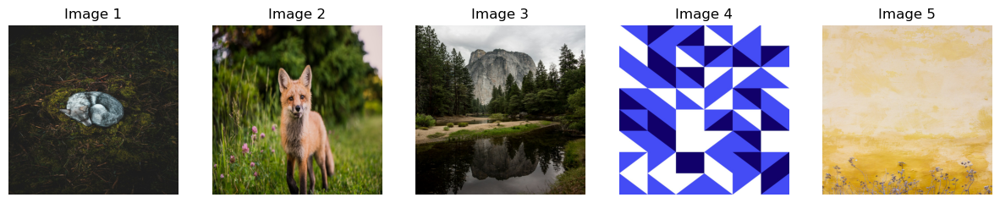

In [3]:
def display_images(images):
    plt.figure(figsize=(15, 10))
    for i, img in enumerate(images):
        plt.subplot(1, 5, i + 1)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f'Image {i + 5}')
    plt.show()

    
display_images(images[:24:5])

# K-means clustering

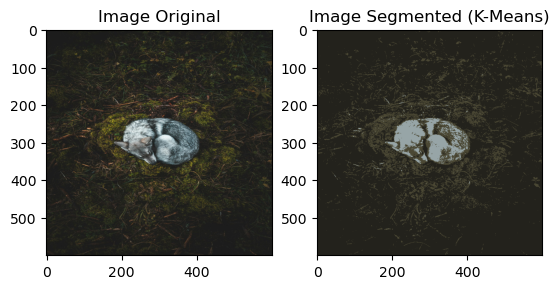

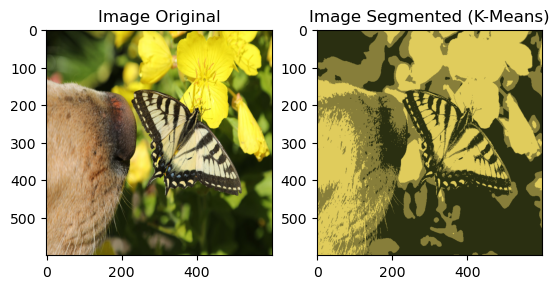

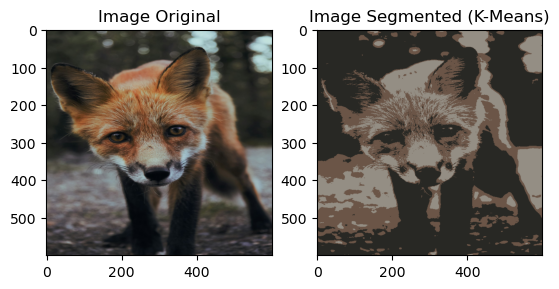

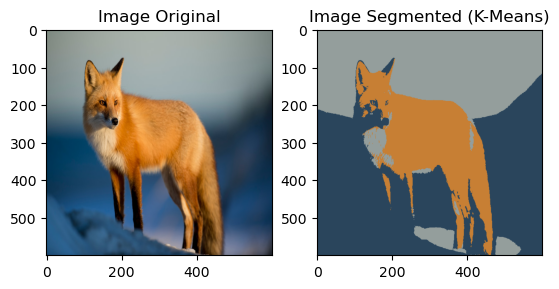

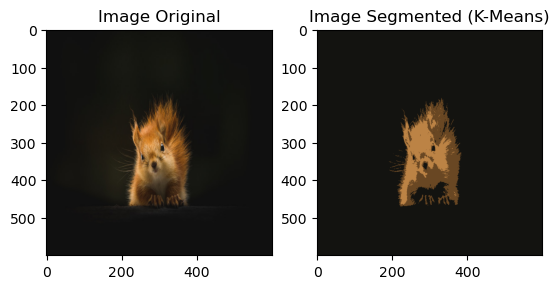

...

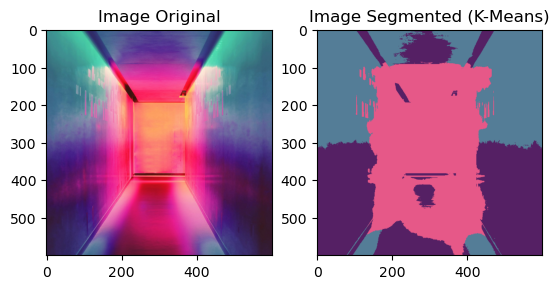

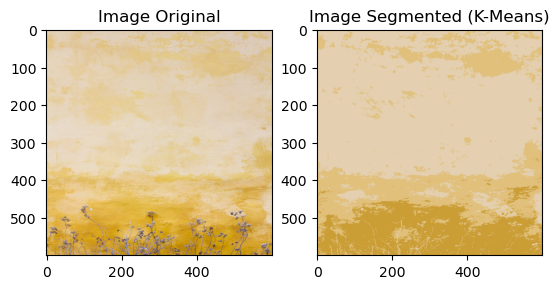

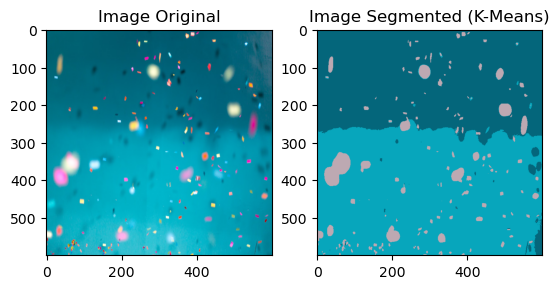

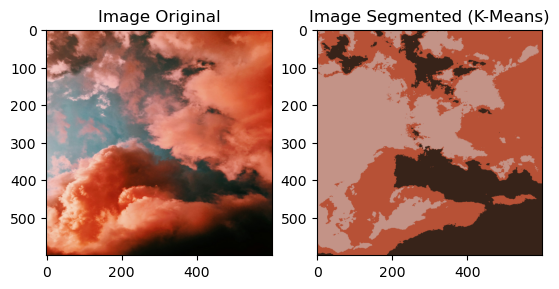

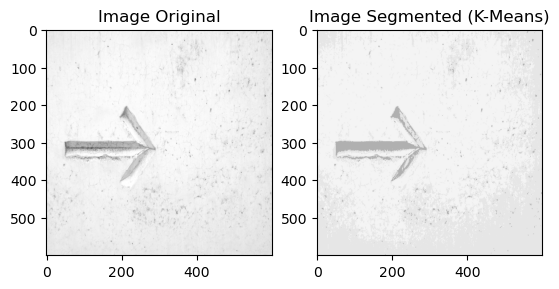

In [26]:
import numpy as np
from sklearn.cluster import KMeans

for i, img in enumerate(images):
    img = np.array(img)
    pixel_valus = img.reshape(-1,3)

    # Normalize pixel values
    pixel_values = pixel_values / 255.0
    
    kmeans = KMeans(n_clusters=3 ,random_state=0)
    kmeans.fit(pixel_valus)
    segmented_image = kmeans.cluster_centers_[kmeans.labels_]
    segmented_image = segmented_image.reshape(img.shape)
    segmented_image = (segmented_image * 255).astype('uint8')

    fig,ax = plt.subplots(1 ,2 )
    ax[0].imshow(img.astype('uint8'))
    ax[0].set_title('Image Original')
    ax[1].imshow(segmented_image.astype('uint8'))
    ax[1].set_title('Image Segmented (K-Means)')
    plt.show()

# Hierarchical Agglomerative Clustering (HAC)

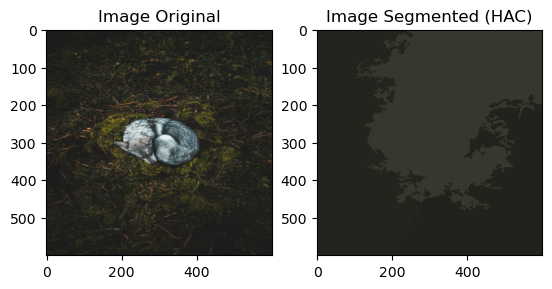

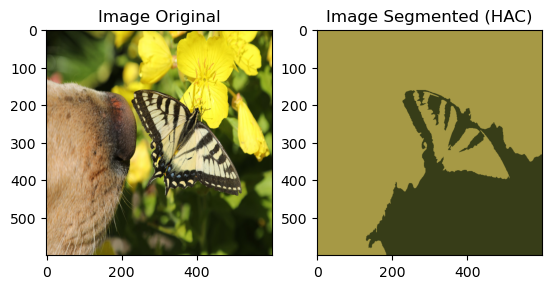

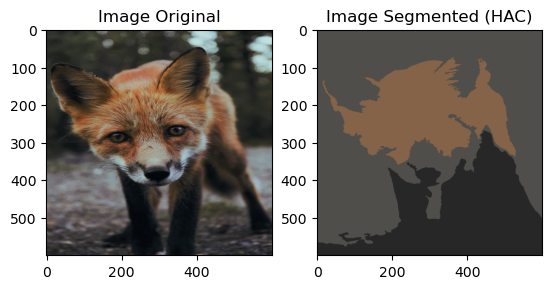

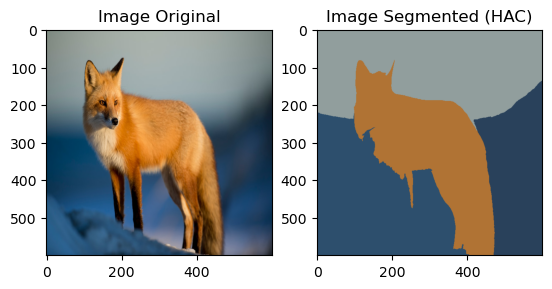

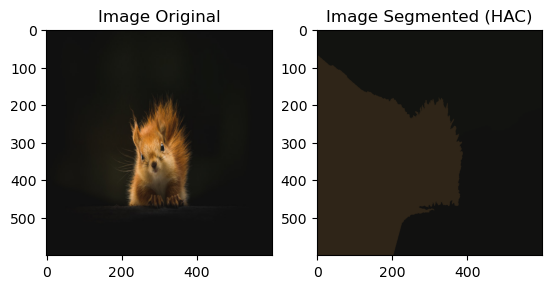

...

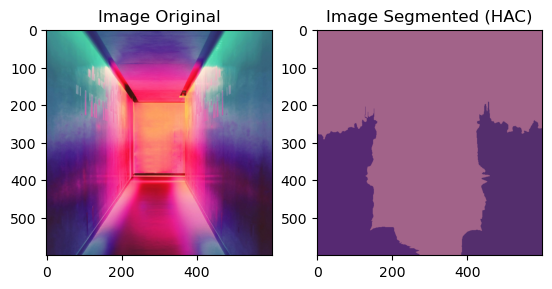

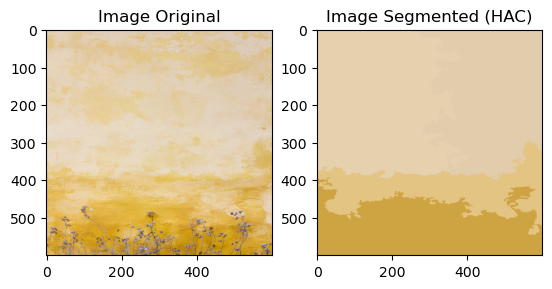

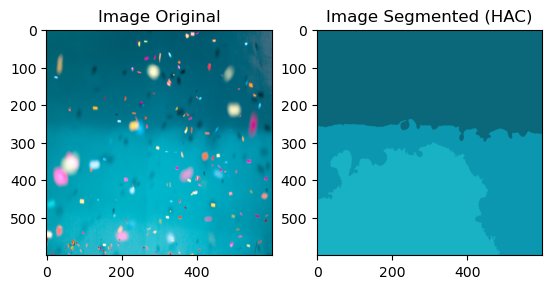

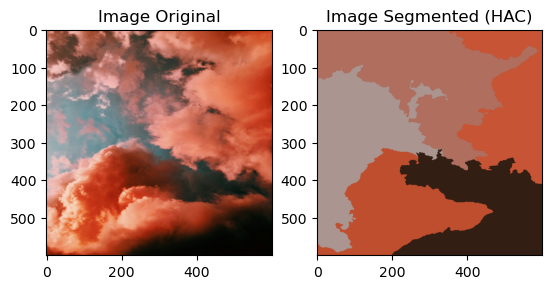

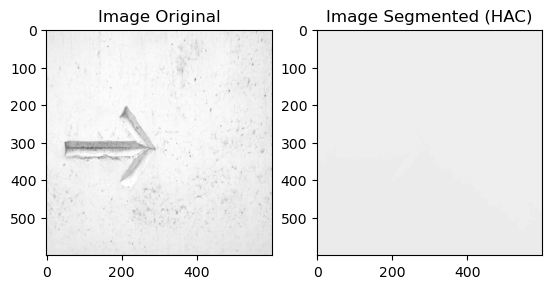

In [30]:
import cv2
from scipy.spatial.distance import pdist,squareform
from scipy.cluster.hierarchy import linkage,fcluster
from skimage import io,segmentation ,color
from skimage import segmentation

for i, img in enumerate(images):
    img = np.array(img)
    pixel_valus = img.reshape(-1,3)

    # Normalize pixel values
    pixel_values = pixel_values / 255.0
    
    #gray = cv2.cvtColor(img , cv2.COLOR_BGR2GRAY)
    labels = segmentation.slic(img, n_segments=3 ,compactness=10 ,sigma=1)
    out = color.label2rgb(labels , img , kind='avg')
    fig,ax = plt.subplots(1, 2)
    ax[0].imshow(img.astype('uint8'))
    ax[0].set_title('Image Original')
    ax[1].imshow(out.astype('uint8'))
    ax[1].set_title('Image Segmented (HAC)')
    plt.show()

# DBSCAN Clustering

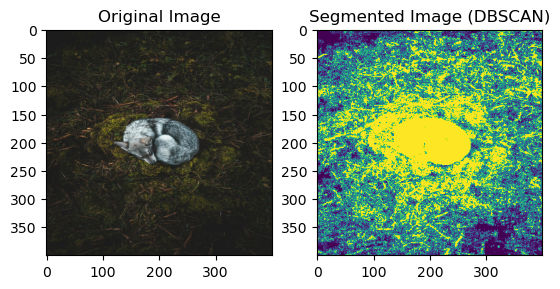

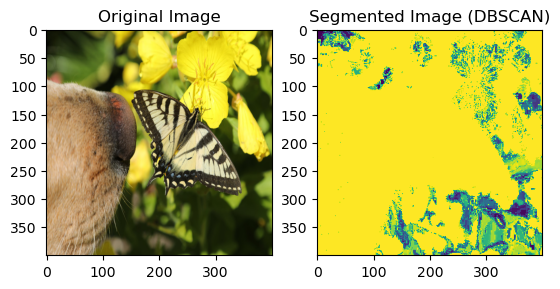


KeyboardInterrupt



In [3]:
from sklearn.cluster import DBSCAN

for i, img in enumerate(images):
    img_array = np.array(img)
    pixel_values = img_array.reshape(-1, 3)

    dbscan = DBSCAN(eps=0.5, min_samples=10)
    labels = dbscan.fit_predict(pixel_values)
    
    # Map the cluster labels back to the original image shape
    clustered_image = labels.reshape(img_array.shape[:2])
    
    # Convert labels to colors for visualization
    #segmented_img = np.zeros_like(img_array)
    #for label in np.unique(labels):
    #    segmented_img[clustered_image == label] = np.median(img_array[clustered_image == label], axis=0)
    
    # Plotting the original and segmented images
    fig, ax = plt.subplots(1, 2)
    ax[0].imshow(img_array.astype('uint8'))
    ax[0].set_title('Original Image')
    ax[1].imshow(clustered_image.astype('uint8'))
    ax[1].set_title('Segmented Image (DBSCAN)')
    plt.show()

# Cluster evaluation

In [27]:
def evaluate_clustering(features, labels):
    if len(np.unique(labels)) > 1:
        return silhouette_score(features, labels)
    else:
        return -1  # Invalid score for single cluster

# Evaluate one by one to prevent memory errors

In [26]:
eval_df = pd.DataFrame(columns=['Image_no', 'Kmeans', 'HAC', 'DBSCAN'])
eval_df

,Image_no,Kmeans,HAC,DBSCAN


In [62]:
import numpy as np
from sklearn.cluster import KMeans
import gc

def visualize_clusters(n):
    img = np.array(images[n])
    pixel_values = img.reshape(-1,3)

    # k-means
    kmeans = KMeans(n_clusters=5 ,random_state=0)
    kmeans.fit(pixel_values)
    segmented_image = kmeans.cluster_centers_[kmeans.labels_]
    segmented_image = segmented_image.reshape(img.shape)

    # Agglomerative 
    labels1 = segmentation.slic(img, n_segments=50, compactness=5,sigma=2)
    out = color.label2rgb(labels1 , img , kind='avg')

    # DDBSCAN
    dbscan = DBSCAN(eps=0.5, min_samples=5)
    labels2 = dbscan.fit_predict(pixel_values)
    clustered_image = labels2.reshape(img.shape[:2])

    #eval_df.insert(value=[i, evaluate_clustering(pixel_values, kmeans.labels_), evaluate_clustering(img, labels1), evaluate_clustering(pixel_values, labels2)])

    fig,ax = plt.subplots(1 , 4)
    ax[0].imshow(img.astype('uint8'))
    ax[0].set_title('Image Original')
    ax[1].imshow(segmented_image.astype('uint8'))
    ax[1].set_title('K-Means')
    ax[2].imshow(out.astype('uint8'))
    ax[2].set_title('HAC')
    ax[3].imshow(clustered_image.astype('uint8'))
    ax[3].set_title('DBSCAN')
    plt.tight_layout()
    plt.show()

    del img, pixel_values, out, labels1, labels2
    gc.collect()

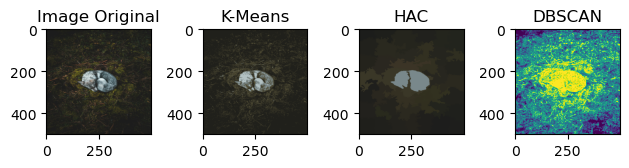

In [68]:
visualize_clusters(0)

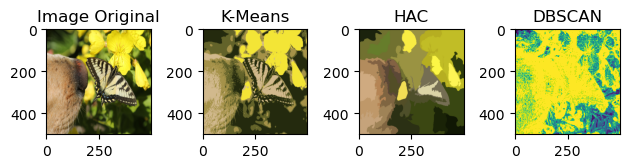

In [65]:
visualize_clusters(1)

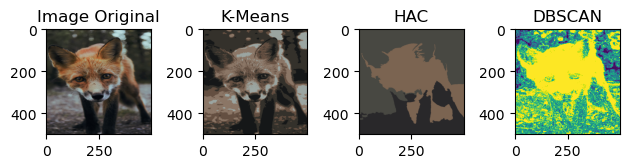

In [37]:
visualize_clusters(2)

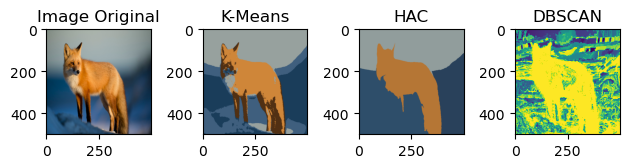

In [38]:
visualize_clusters(3)

In [5]:
visualize_clusters(4)

MemoryError: 

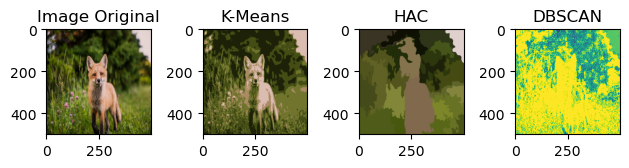

In [80]:
visualize_clusters(5)

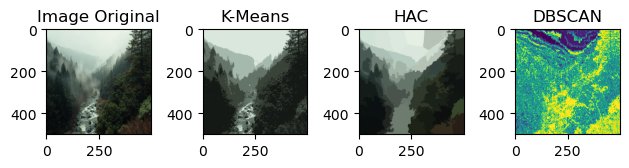

In [71]:
visualize_clusters(6)

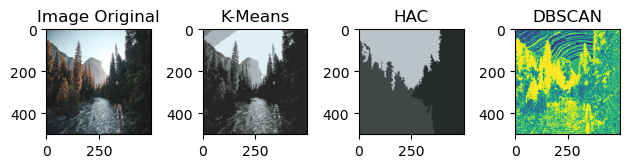

In [8]:
visualize_clusters(7)

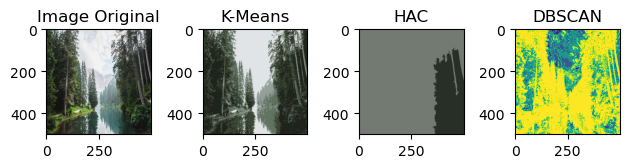

In [9]:
visualize_clusters(8)

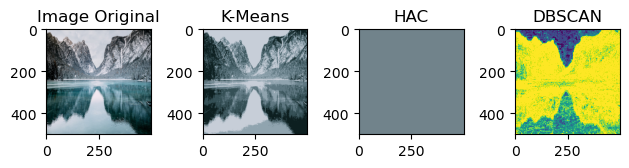

In [10]:
visualize_clusters(9)

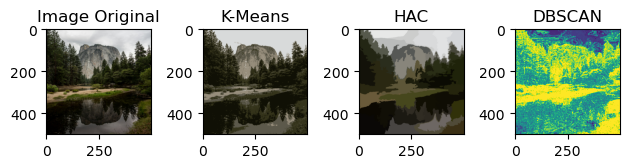

In [77]:
visualize_clusters(10)

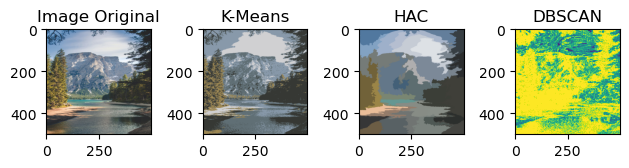

In [64]:
visualize_clusters(11)

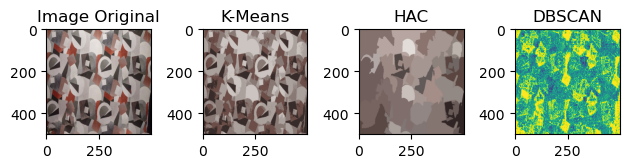

In [69]:
visualize_clusters(12)

In [22]:
visualize_clusters(13)

MemoryError: 

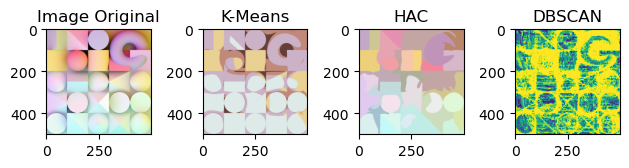

In [66]:
visualize_clusters(14)

In [24]:
visualize_clusters(15)

MemoryError: 

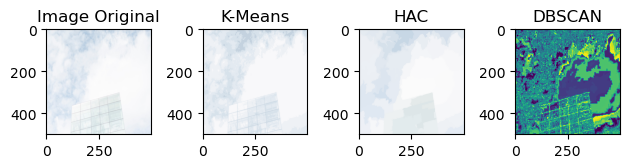

In [67]:
visualize_clusters(16)

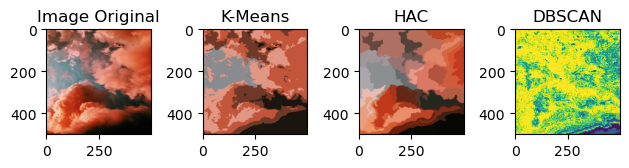

In [81]:
visualize_clusters(22)

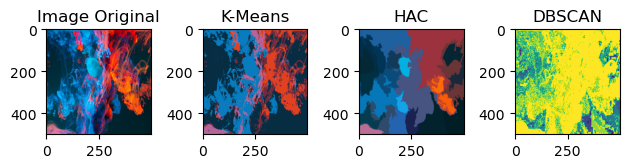

In [70]:
visualize_clusters(18)

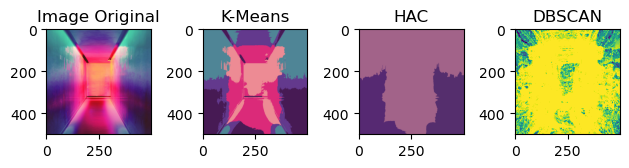

In [28]:
visualize_clusters(19)

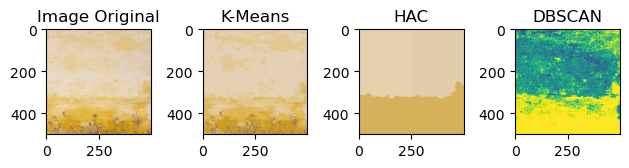

In [29]:
visualize_clusters(20)

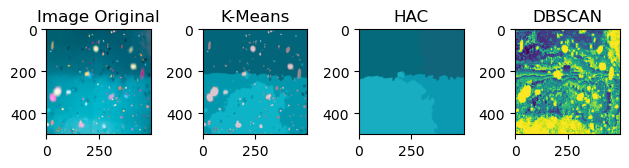

In [30]:
visualize_clusters(21)

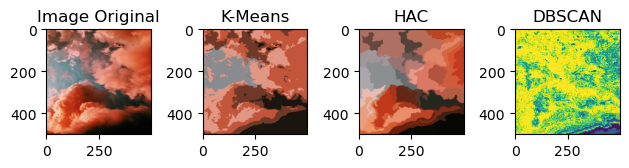

In [63]:
visualize_clusters(22)

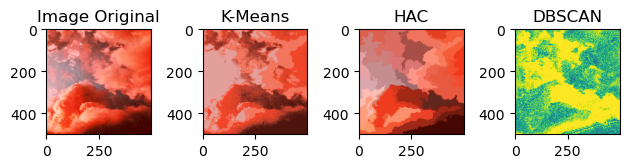

In [86]:
## adding noise to images and redo the clustering
img = np.array(images[22])
uni_noise=np.zeros(img.shape, dtype=np.uint8)
cv2.randu(uni_noise,0,255)
uni_noise=(uni_noise*0.5).astype(np.uint8)

img=cv2.add(img, uni_noise)
pixel_values = img.reshape(-1,3)

# k-means
kmeans = KMeans(n_clusters=5 ,random_state=0)
kmeans.fit(pixel_values)
segmented_image = kmeans.cluster_centers_[kmeans.labels_]
segmented_image = segmented_image.reshape(img.shape)

# Agglomerative 
labels1 = segmentation.slic(img, n_segments=50, compactness=5,sigma=2)
out = color.label2rgb(labels1 , img , kind='avg')

# DDBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)
labels2 = dbscan.fit_predict(pixel_values)
clustered_image = labels2.reshape(img.shape[:2])

#eval_df.insert(value=[i, evaluate_clustering(pixel_values, kmeans.labels_), evaluate_clustering(img, labels1), evaluate_clustering(pixel_values, labels2)])

fig,ax = plt.subplots(1 , 4)
ax[0].imshow(img.astype('uint8'))
ax[0].set_title('Image Original')
ax[1].imshow(segmented_image.astype('uint8'))
ax[1].set_title('K-Means')
ax[2].imshow(out.astype('uint8'))
ax[2].set_title('HAC')
ax[3].imshow(clustered_image.astype('uint8'))
ax[3].set_title('DBSCAN')
plt.tight_layout()
plt.show()

In [32]:
visualize_clusters(23)

MemoryError: 

# Memory Error images (DBSCAN)

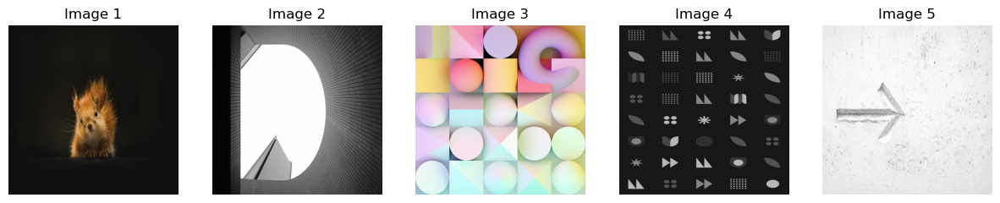

In [40]:
failed_images = [images[4], images[13], images[14], images[17], images[23]]
plt.figure(figsize=(15, 10))
for i, img in enumerate(failed_images):
    plt.subplot(1, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(f'Image {i+1}')
plt.show()